<a href="https://colab.research.google.com/github/Rryyuuu/capstone/blob/main/notebooks/image_predictor_example.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [3]:
# Copyright (c) Meta Platforms, Inc. and affiliates.

# Object masks in images from prompts with SAM 2

Segment Anything Model 2 (SAM 2) predicts object masks given prompts that indicate the desired object. The model first converts the image into an image embedding that allows high quality masks to be efficiently produced from a prompt.

The `SAM2ImagePredictor` class provides an easy interface to the model for prompting the model. It allows the user to first set an image using the `set_image` method, which calculates the necessary image embeddings. Then, prompts can be provided via the `predict` method to efficiently predict masks from those prompts. The model can take as input both point and box prompts, as well as masks from the previous iteration of prediction.

<a target="_blank" href="https://colab.research.google.com/github/facebookresearch/sam2/blob/main/notebooks/image_predictor_example.ipynb">
  <img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/>
</a>

## Environment Set-up

If running locally using jupyter, first install `sam2` in your environment using the [installation instructions](https://github.com/facebookresearch/sam2#installation) in the repository.

If running from Google Colab, set `using_colab=True` below and run the cell. In Colab, be sure to select 'GPU' under 'Edit'->'Notebook Settings'->'Hardware accelerator'. Note that it's recommended to use **A100 or L4 GPUs when running in Colab** (T4 GPUs might also work, but could be slow and might run out of memory in some cases).

In [4]:
using_colab = True

In [5]:
if using_colab:
    import torch
    import torchvision
    print("PyTorch version:", torch.__version__)
    print("Torchvision version:", torchvision.__version__)
    print("CUDA is available:", torch.cuda.is_available())
    import sys
    !{sys.executable} -m pip install opencv-python matplotlib
    !{sys.executable} -m pip install 'git+https://github.com/facebookresearch/sam2.git'

    !mkdir -p images
    !wget -P images https://raw.githubusercontent.com/facebookresearch/sam2/main/notebooks/images/truck.jpg
    !wget -P images https://raw.githubusercontent.com/facebookresearch/sam2/main/notebooks/images/groceries.jpg

    !mkdir -p ../checkpoints/
    !wget -P ../checkpoints/ https://dl.fbaipublicfiles.com/segment_anything_2/092824/sam2.1_hiera_large.pt

PyTorch version: 2.5.1+cu124
Torchvision version: 0.20.1+cu124
CUDA is available: True
  Cloning https://github.com/facebookresearch/sam2.git to /tmp/pip-req-build-fdak_9ly
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/sam2.git /tmp/pip-req-build-fdak_9ly
  Resolved https://github.com/facebookresearch/sam2.git to commit 2b90b9f5ceec907a1c18123530e92e794ad901a4
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.2/42.2 kB 2.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 117.0/117.0 kB 5.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Using cached nvidia_cuda_nvrtc_cu12-12.4.127-py3-none-manylinux2014_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_runtime_cu12-12.4.127-py3-none-manylinux2014_x86_64.whl.metadata (1.5 kB)
  Using cache

## Set-up

Necessary imports and helper functions for displaying points, boxes, and masks.

In [4]:
import os
# if using Apple MPS, fall back to CPU for unsupported ops
os.environ["PYTORCH_ENABLE_MPS_FALLBACK"] = "1"
import numpy as np
import torch
import matplotlib.pyplot as plt
from PIL import Image

In [5]:
# select the device for computation
if torch.cuda.is_available():
    device = torch.device("cuda")
elif torch.backends.mps.is_available():
    device = torch.device("mps")
else:
    device = torch.device("cpu")
print(f"using device: {device}")

if device.type == "cuda":
    # use bfloat16 for the entire notebook
    torch.autocast("cuda", dtype=torch.bfloat16).__enter__()
    # turn on tfloat32 for Ampere GPUs (https://pytorch.org/docs/stable/notes/cuda.html#tensorfloat-32-tf32-on-ampere-devices)
    if torch.cuda.get_device_properties(0).major >= 8:
        torch.backends.cuda.matmul.allow_tf32 = True
        torch.backends.cudnn.allow_tf32 = True
elif device.type == "mps":
    print(
        "\nSupport for MPS devices is preliminary. SAM 2 is trained with CUDA and might "
        "give numerically different outputs and sometimes degraded performance on MPS. "
        "See e.g. https://github.com/pytorch/pytorch/issues/84936 for a discussion."
    )

using device: cuda


In [6]:
np.random.seed(3)

def show_mask(mask, ax, random_color=False, borders = True):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
    else:
        color = np.array([30/255, 144/255, 255/255, 0.6])
    h, w = mask.shape[-2:]
    mask = mask.astype(np.uint8)
    mask_image =  mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    if borders:
        import cv2
        contours, _ = cv2.findContours(mask,cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
        # Try to smooth contours
        contours = [cv2.approxPolyDP(contour, epsilon=0.01, closed=True) for contour in contours]
        mask_image = cv2.drawContours(mask_image, contours, -1, (1, 1, 1, 0.5), thickness=2)
    ax.imshow(mask_image)

def show_points(coords, labels, ax, marker_size=375):
    pos_points = coords[labels==1]
    neg_points = coords[labels==0]
    ax.scatter(pos_points[:, 0], pos_points[:, 1], color='green', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)
    ax.scatter(neg_points[:, 0], neg_points[:, 1], color='red', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)

def show_box(box, ax):
    x0, y0 = box[0], box[1]
    w, h = box[2] - box[0], box[3] - box[1]
    ax.add_patch(plt.Rectangle((x0, y0), w, h, edgecolor='green', facecolor=(0, 0, 0, 0), lw=2))

def show_masks(image, masks, scores, point_coords=None, box_coords=None, input_labels=None, borders=True):
    for i, (mask, score) in enumerate(zip(masks, scores)):
        plt.figure(figsize=(10, 10))
        plt.imshow(image)
        show_mask(mask, plt.gca(), borders=borders)
        if point_coords is not None:
            assert input_labels is not None
            show_points(point_coords, input_labels, plt.gca())
        if box_coords is not None:
            # boxes
            show_box(box_coords, plt.gca())
        if len(scores) > 1:
            plt.title(f"Mask {i+1}, Score: {score:.3f}", fontsize=18)
        plt.axis('off')
        plt.show()

## Example image

In [7]:
import cv2
image = Image.open('/content/drive/MyDrive/대학원/sam2 건물탐지/정사사진데이터셋생성/부산진구/patches_m/aerial/patch_109_3584_4096.tif')
image = np.array(image.convert("RGB"))
image_height, image_width, _ = image.shape
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

In [11]:
!apt-get update
!apt-get install -y gdal-bin python3-gdal
!pip install rasterio

Get:1 http://security.ubuntu.com/ubuntu jammy-security InRelease [129 kB]
Get:2 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  InRelease [1,581 B]
Get:3 https://cloud.r-project.org/bin/linux/ubuntu jammy-cran40/ InRelease [3,632 B]
Get:4 https://r2u.stat.illinois.edu/ubuntu jammy InRelease [6,555 B]
Get:5 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  Packages [1,309 kB]
Hit:6 http://archive.ubuntu.com/ubuntu jammy InRelease
Get:7 https://cloud.r-project.org/bin/linux/ubuntu jammy-cran40/ Packages [66.7 kB]
Get:8 http://archive.ubuntu.com/ubuntu jammy-updates InRelease [128 kB]
Get:9 http://security.ubuntu.com/ubuntu jammy-security/main amd64 Packages [2,606 kB]
Hit:10 https://ppa.launchpadcontent.net/deadsnakes/ppa/ubuntu jammy InRelease
Get:11 https://r2u.stat.illinois.edu/ubuntu jammy/main amd64 Packages [2,653 kB]
Get:12 http://security.ubuntu.com/ubuntu jammy-security/universe amd64 Packages [1,230 kB]
Get:13 https://ppa.la

In [8]:
import geopandas as gpd
import numpy as np
import rasterio
from rasterio.transform import rowcol

In [25]:
aerial_photo_path = '/content/drive/MyDrive/대학원/sam2 건물탐지/정사사진데이터셋생성/부산진구/patches/aerial/patch_143_3584_8704.tif'
with rasterio.open(aerial_photo_path) as src:
    print("항공 사진의 CRS:", src.crs)
    # 만약 shapefile의 CRS가 항공 사진의 CRS와 다르다면, 동일한 좌표계로 재투영합니다.
    if gdf.crs != src.crs:
        gdf = gdf.to_crs(src.crs)
        print("shapefile의 좌표계를 항공 사진의 CRS로 재투영하였습니다.")

    # 항공 사진 전체를 NumPy 배열로 읽어옵니다.
    # 배열의 형태는 (밴드, 높이, 너비)입니다. 여기서는 RGB 이미지(3 밴드)를 가정합니다.
    aerial_image = src.read()
    transform = src.transform

if aerial_image.shape[0] >= 3:
    # 배열의 차원을 (밴드, 높이, 너비)에서 (높이, 너비, 밴드)로 전환합니
    다.
    img = np.dstack([aerial_image[i] for i in range(3)])
else:
    # 단일 밴드 이미지의 경우 첫 번째 밴드를 그대로 사용합니다.
    img = aerial_image[0]

SyntaxError: invalid syntax (<ipython-input-25-aec328cea872>, line 16)

In [23]:
image = img

NameError: name 'img' is not defined

In [ ]:


# 파일 경로 설정 (사용자에 맞게 수정)
shapefile_path = '/content/drive/MyDrive/대학원/sam2 건물탐지/정사사진데이터셋생성/부산진구/patches_m/shp/patch_109_3584_4096.shp'
aerial_photo_path = '/content/drive/MyDrive/대학원/sam2 건물탐지/정사사진데이터셋생성/부산진구/patches_m/aerial/patch_109_3584_4096.tif'

# shapefile 불러오기 (인코딩 문제가 있으면 인코딩 인자 추가)
gdf = gpd.read_file(shapefile_path, encoding='cp949')

# 항공 사진 열기 및 메타데이터/transform 가져오기
with rasterio.open(aerial_photo_path) as src:
    transform = src.transform
    height = src.height
    width = src.width

# 각 지오메트리에 대해 bounding box를 항공사진의 그리드(픽셀 좌표)로 변환
bbox_list = []  # 각 지오메트리의 bounding box를 저장할 리스트 (형태: np.array([row_min, col_min, row_max, col_max]))
for idx, geom in enumerate(gdf.geometry):
    if geom is None:
        continue
    # shapely 객체의 bounds는 (minx, miny, maxx, maxy)를 반환합니다.
    minx, miny, maxx, maxy = geom.bounds

    # 항공 사진 그리드에 맞게 좌표 변환:
    # rasterio.transform.rowcol(transform, x, y)는 주어진 공간 좌표(x, y)를 픽셀의 (row, col)로 변환합니다.
    # 주의: y 좌표는 상하 반전되어 있으므로, 좌상단은 (minx, maxy), 우하단은 (maxx, miny)로 변환합니다.
    row_min, col_min = rowcol(transform, minx, maxy)  # 좌상단 픽셀
    row_max, col_max = rowcol(transform, maxx, miny)  # 우하단 픽셀

    # 이미지 범위 내로 클리핑 (옵션)
    row_min = max(0, row_min)
    col_min = max(0, col_min)
    row_max = min(height - 1, row_max)
    col_max = min(width - 1, col_max)

    input_box = np.array([row_min, col_min, row_max, col_max])
    bbox_list.append(input_box)
    print(f"Geometry {idx}의 bounding box (픽셀 좌표):", input_box)

# bbox_list에는 shapefile 내 각 feature의 bounding box가 numpy 배열 형태로 저장되어 있습니다.


In [ ]:
import geopandas as gpd
import numpy as np
import rasterio

# 파일 경로 설정 (사용자에 맞게 수정)
shapefile_path = '/content/drive/MyDrive/대학원/sam2 건물탐지/정사사진데이터셋생성/부산진구/patches_m/shp/patch_109_3584_4096.shp'
aerial_photo_path = '/content/drive/MyDrive/대학원/sam2 건물탐지/정사사진데이터셋생성/부산진구/patches_m/aerial/patch_109_3584_4096.tif'

# shapefile 불러오기 (인코딩 필요 시 cp949 사용)
gdf = gpd.read_file(shapefile_path, encoding='cp949')

# 항공 사진의 transform 정보를 얻기 위해 파일 열기
with rasterio.open(aerial_photo_path) as src:
    transform = src.transform

# 각 지오메트리의 원래 좌표(공간 좌표)를 픽셀 좌표로 변환하여 출력
for idx, geom in enumerate(gdf.geometry):
    if geom is None:
        continue
    # Polygon의 경우: 외곽선(LineString)을 사용
    if geom.geom_type == 'Polygon':
        # world coordinates: (x, y)
        world_coords = np.array(geom.exterior.coords)
        # 각 좌표를 픽셀 좌표 (row, col)로 변환
        pixel_coords = np.array([rasterio.transform.rowcol(transform, x, y) for x, y in world_coords])
        print(f"Geometry {idx}의 픽셀 좌표 (row, col):\n", pixel_coords)
    # MultiPolygon의 경우: 각 Polygon에 대해 별도 처리
    elif geom.geom_type == 'MultiPolygon':
        for poly_idx, poly in enumerate(geom.geoms):
            world_coords = np.array(poly.exterior.coords)
            pixel_coords = np.array([rasterio.transform.rowcol(transform, x, y) for x, y in world_coords])
            print(f"Geometry {idx}의 MultiPolygon {poly_idx}의 픽셀 좌표 (row, col):\n", pixel_coords)
    # 그 외 (LineString 등)
    else:
        try:
            world_coords = np.array(geom.coords)
            pixel_coords = np.array([rasterio.transform.rowcol(transform, x, y) for x, y in world_coords])
            print(f"Geometry {idx}의 픽셀 좌표 (row, col):\n", pixel_coords)
        except Exception as e:
            print(f"Geometry {idx} 변환 중 오류 발생:", e)



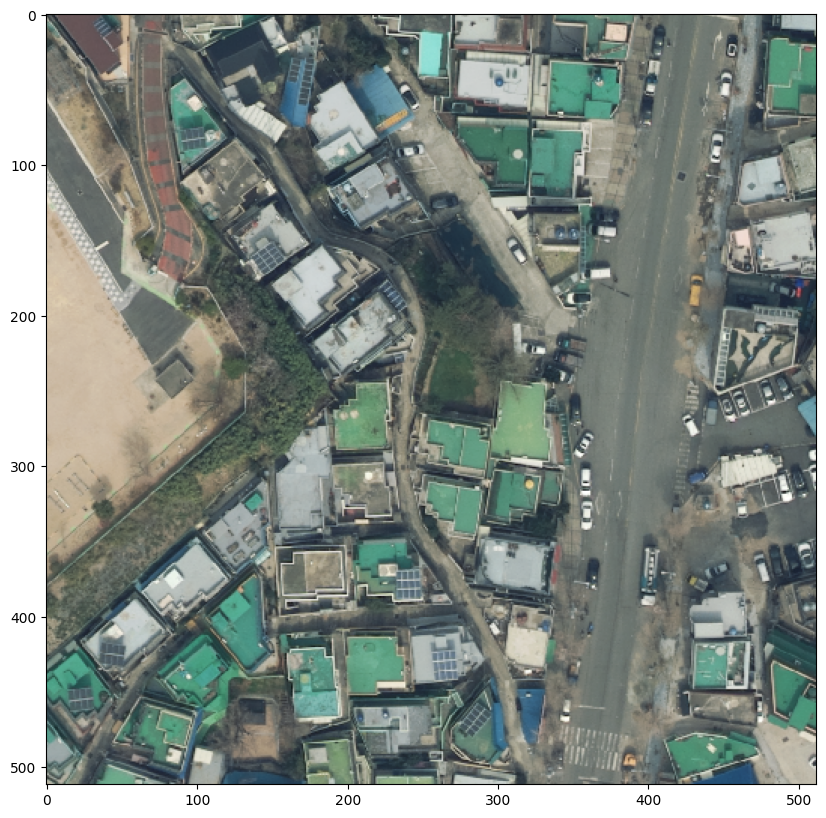

In [9]:
plt.figure(figsize=(10, 10))
plt.imshow(image)
plt.axis('on')
plt.show()

## Selecting objects with SAM 2

First, load the SAM 2 model and predictor. Change the path below to point to the SAM 2 checkpoint. Running on CUDA and using the default model are recommended for best results.

In [10]:
from sam2.build_sam import build_sam2
from sam2.sam2_image_predictor import SAM2ImagePredictor

sam2_checkpoint = "../checkpoints/sam2.1_hiera_large.pt"
model_cfg = "configs/sam2.1/sam2.1_hiera_l.yaml"

sam2_model = build_sam2(model_cfg, sam2_checkpoint, device=device)

predictor = SAM2ImagePredictor(sam2_model)

Process the image to produce an image embedding by calling `SAM2ImagePredictor.set_image`. `SAM2ImagePredictor` remembers this embedding and will use it for subsequent mask prediction.

In [11]:
predictor.set_image(image)

To select the truck, choose a point on it. Points are input to the model in (x,y) format and come with labels 1 (foreground point) or 0 (background point). Multiple points can be input; here we use only one. The chosen point will be shown as a star on the image.

In [ ]:
input_point = np.array([[500, 375]])
input_label = np.array([1])

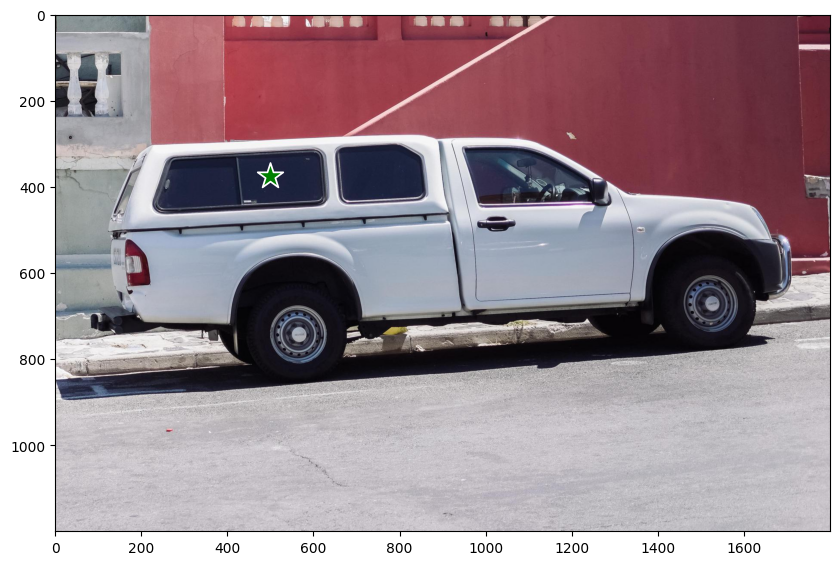

In [ ]:
plt.figure(figsize=(10, 10))
plt.imshow(image)
show_points(input_point, input_label, plt.gca())
plt.axis('on')
plt.show()

In [ ]:
print(predictor._features["image_embed"].shape, predictor._features["image_embed"][-1].shape)

torch.Size([1, 256, 64, 64]) torch.Size([256, 64, 64])


Predict with `SAM2ImagePredictor.predict`. The model returns masks, quality predictions for those masks, and low resolution mask logits that can be passed to the next iteration of prediction.

In [ ]:
masks, scores, logits = predictor.predict(
    point_coords=input_point,
    point_labels=input_label,
    multimask_output=True,
)
sorted_ind = np.argsort(scores)[::-1]
masks = masks[sorted_ind]
scores = scores[sorted_ind]
logits = logits[sorted_ind]

With `multimask_output=True` (the default setting), SAM 2 outputs 3 masks, where `scores` gives the model's own estimation of the quality of these masks. This setting is intended for ambiguous input prompts, and helps the model disambiguate different objects consistent with the prompt. When `False`, it will return a single mask. For ambiguous prompts such as a single point, it is recommended to use `multimask_output=True` even if only a single mask is desired; the best single mask can be chosen by picking the one with the highest score returned in `scores`. This will often result in a better mask.

In [ ]:
masks.shape  # (number_of_masks) x H x W

(3, 1200, 1800)

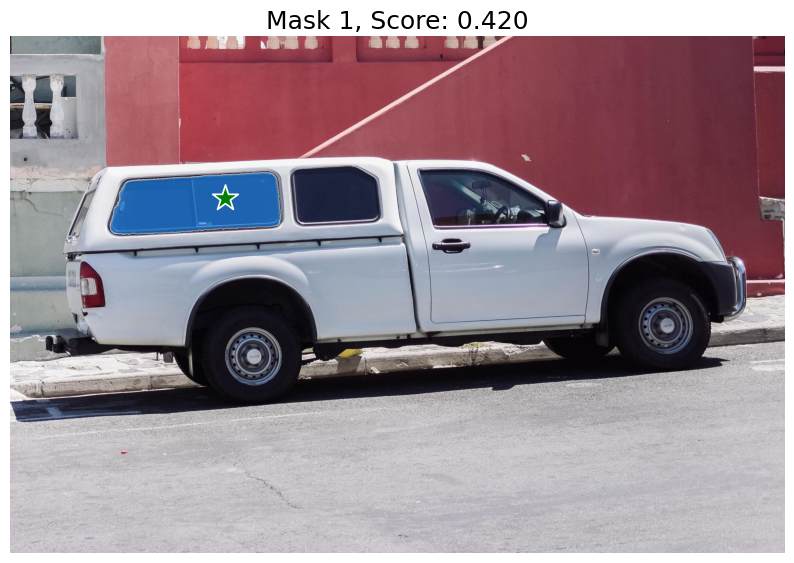

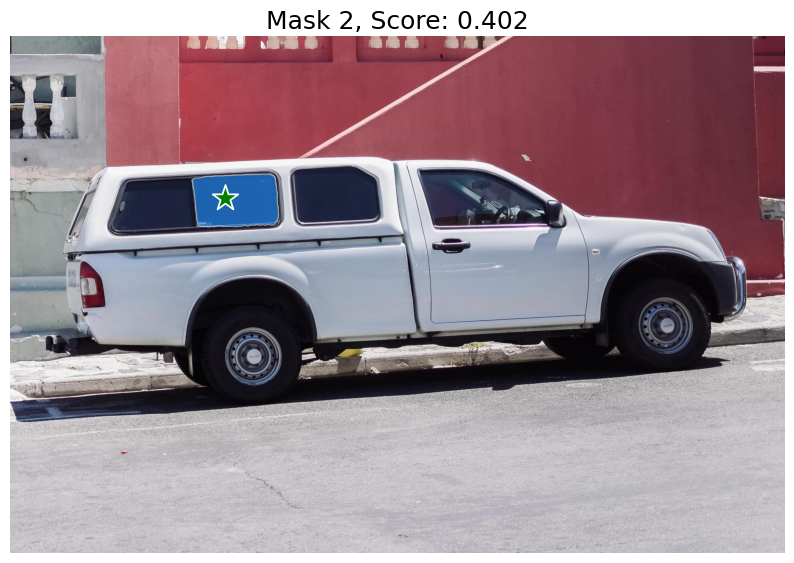

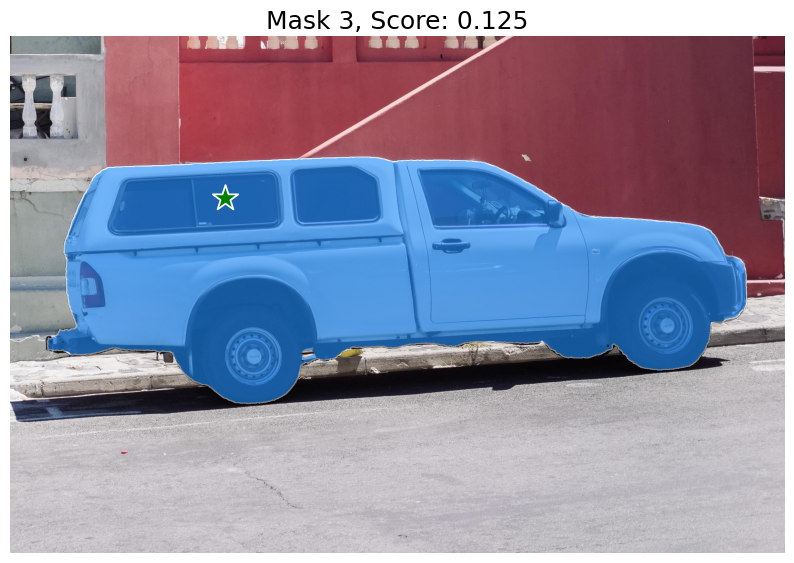

In [ ]:
show_masks(image, masks, scores, point_coords=input_point, input_labels=input_label, borders=True)

## Specifying a specific object with additional points

The single input point is ambiguous, and the model has returned multiple objects consistent with it. To obtain a single object, multiple points can be provided. If available, a mask from a previous iteration can also be supplied to the model to aid in prediction. When specifying a single object with multiple prompts, a single mask can be requested by setting `multimask_output=False`.

In [ ]:
input_point = np.array([[500, 375], [1125, 625]])
input_label = np.array([1, 1])

mask_input = logits[np.argmax(scores), :, :]  # Choose the model's best mask

In [ ]:
masks, scores, _ = predictor.predict(
    point_coords=input_point,
    point_labels=input_label,
    mask_input=mask_input[None, :, :],
    multimask_output=False,
)

In [ ]:
masks.shape

(1, 1200, 1800)

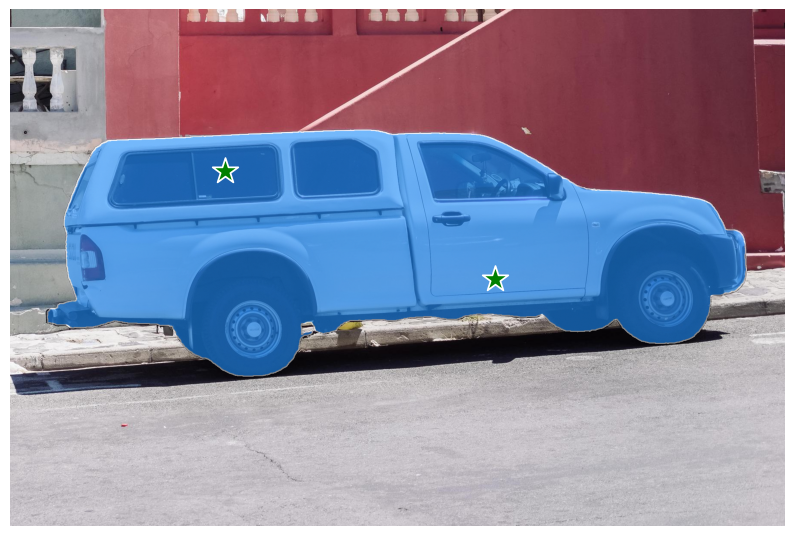

In [ ]:
show_masks(image, masks, scores, point_coords=input_point, input_labels=input_label)

To exclude the car and specify just the window, a background point (with label 0, here shown in red) can be supplied.

In [ ]:
input_point = np.array([[500, 375], [1125, 625]])
input_label = np.array([1, 0])

mask_input = logits[np.argmax(scores), :, :]  # Choose the model's best mask

In [ ]:
masks, scores, _ = predictor.predict(
    point_coords=input_point,
    point_labels=input_label,
    mask_input=mask_input[None, :, :],
    multimask_output=False,
)

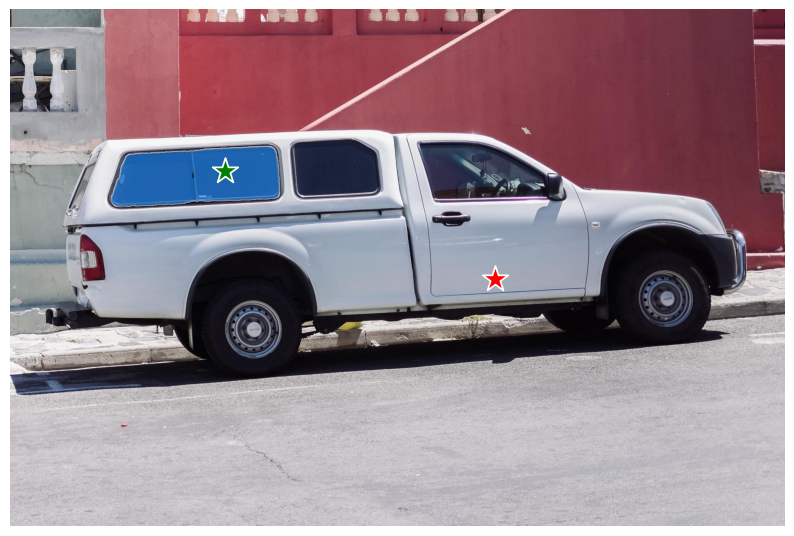

In [ ]:
show_masks(image, masks, scores, point_coords=input_point, input_labels=input_label)

## Specifying a specific object with a box

The model can also take a box as input, provided in xyxy format.

In [10]:
import os
import csv
import numpy as np

# ---------------------------
# 1. 입력 파일 경로 설정
annotation_csv_path = "/content/drive/MyDrive/대학원/sam2 건물탐지/정사사진데이터셋생성/부산진구/patches_png/annotations/ann_patch_109_3584_4096.csv"


# ---------------------------
# 3. CSV 바운딩박스 로드
# ---------------------------
bboxes = []  # [ [x_min, y_min, x_max, y_max], [...], ... ]
with open(annotation_csv_path, 'r', encoding='utf-8-sig') as f:
    reader = csv.DictReader(f)
    for row in reader:
        # CSV 헤더가 ["polygon_id", "x_min", "y_min", "x_max", "y_max"] 라고 가정
        x_min = int(row["x_min"])
        y_min = int(row["y_min"])
        x_max = int(row["x_max"])
        y_max = int(row["y_max"])
        # 간단한 유효성 검사(박스가 이미지 범위 안에 있는지 확인)
        if not (0 <= x_min < image_width and 0 <= x_max <= image_width and
                0 <= y_min < image_height and 0 <= y_max <= image_height):
            # 필요 시 경고만 하고 넘어가거나, 제거할 수 있음
            print(f"경고: 이미지 범위를 벗어난 박스가 있습니다: {[x_min, y_min, x_max, y_max]}")
        bboxes.append([x_min, y_min, x_max, y_max])

print(f"총 {len(bboxes)}개의 바운딩박스를 로드했습니다.")



총 0개의 바운딩박스를 로드했습니다.


In [ ]:
# ---------------------------
# 4. SAM 모델 로드 및 Predictor 설정
# ---------------------------
device = "cuda" if torch.cuda.is_available() else "cpu"
sam = sam_model_registry[model_type](checkpoint=sam_checkpoint)
sam.to(device=device)

predictor = SamPredictor(sam)

# SAM은 이미지를 NumPy, torch.Tensor 등으로 입력 가능
# OpenCV로 불러온 이미지를 그대로 set_image()에 전달 가능
predictor.set_image(image_bgr)

# ---------------------------
# 5. SAM 추론 (bounding box prompt)
# ---------------------------
# 예시: 각 bounding box마다 segmentation 수행
# boxes=np.array([...]) 에 여러 개의 박스를 한 번에 넣어도 되나,
# 여기서는 일단 박스 하나씩 반복하면서 수행 예시를 보여줍니다.
for idx, input_box in enumerate(bboxes):
    # boxes는 (N, 4) shape의 NumPy 배열
    box_arr = np.array([input_box], dtype=np.float32)  # shape (1, 4)

    masks, scores, logits = predictor.predict(
        point_coords=None,
        point_labels=None,
        boxes=box_arr,
        multimask_output=True  # True면 3개 후보 mask 반환, False면 1개 반환
    )

    # masks.shape = (num_masks, H, W), scores.shape = (num_masks,)
    # 여기서 masks[i]는 해당 박스 prompt에 대한 세그멘테이션 결과

    print(f"[{idx}] 박스 {input_box} -> {len(masks)}개 마스크 예측, 점수={scores}")

    # 예: 가장 높은 점수의 mask만 추출
    best_idx = np.argmax(scores)
    best_mask = masks[best_idx]  # (H, W) 이진(0/1) mask
    best_score = scores[best_idx]

    # -----------------------------
    # (선택) 마스크 시각화/저장
    # -----------------------------
    # 1) mask 시각화
    #   원본 이미지 위에 반투명 색상 overlay
    overlay = image_bgr.copy()
    overlay[best_mask > 0] = (0, 255, 0)  # 마스크 부분을 녹색
    alpha = 0.5
    visualize_img = cv2.addWeighted(overlay, alpha, image_bgr, 1 - alpha, 0)

    # 2) 결과 저장(파일명 예: mask_000_idx.png)
    save_path = f"/path/to/output/mask_{idx:03d}.png"
    cv2.imwrite(save_path, (best_mask*255).astype(np.uint8))

    # 3) 시각화 예시(원한다면 colab 환경에서 imshow 등)
    # cv2.imshow('mask', visualize_img); cv2.waitKey(0)

print("SAM inference 완료.")


In [29]:
import math

aerial_photo_path = '/content/drive/MyDrive/대학원/sam2 건물탐지/정사사진데이터셋생성/부산진구/patches_m/aerial/patch_109_3584_4096.tif'   # 항공 사진 파일 경로를 지정합니다.
shapefile_path = '/content/drive/MyDrive/대학원/sam2 건물탐지/정사사진데이터셋생성/부산진구/patches_m/shp/patch_109_3584_4096.shp'         # 숫자 지도 (Shapefile) 파일 경로를 지정합니다.

image_info = rasterio.open(aerial_photo_path)

gdf = gpd.read_file(shapefile_path, encoding='CP949')
print("shapefile의 CRS:", gdf.crs)

# -------------------------------
# 2단계: 항공 사진 열기
# -------------------------------
# Rasterio를 사용하여 항공 사진을 엽니다.
with rasterio.open(aerial_photo_path) as src:
    print("항공 사진의 CRS:", src.crs)
    # 만약 shapefile의 CRS가 항공 사진의 CRS와 다르다면, 동일한 좌표계로 재투영합니다.
    if gdf.crs != src.crs:
        gdf = gdf.to_crs(src.crs)
        print("shapefile의 좌표계를 항공 사진의 CRS로 재투영하였습니다.")

    # 항공 사진 전체를 NumPy 배열로 읽어옵니다.
    # 배열의 형태는 (밴드, 높이, 너비)입니다. 여기서는 RGB 이미지(3 밴드)를 가정합니다.
    aerial_image = src.read()
    transform = src.transform

def geotiff_object_to_image(E, N, geotiff_info):
    """
    Convert map coordinates (E, N) to image coordinates (col, row) using GeoTIFF metadata.

    Parameters:
        E (float): Easting (X coordinate) in map coordinates.
        N (float): Northing (Y coordinate) in map coordinates.
        geotiff_info (rasterio.io.DatasetReader): GeoTIFF metadata obtained using rasterio.open.

    Returns:
        tuple: Image coordinates (col, row).
    """
    # Extract necessary metadata
    pixel_scale = geotiff_info.transform.a, -geotiff_info.transform.e  # Pixel size (width, height)
    origin_x = geotiff_info.transform.c  # Upper-left x-coordinate
    origin_y = geotiff_info.transform.f  # Upper-left y-coordinate

    # Compute image coordinates
    col = (E - origin_x) / pixel_scale[0]
    row = (origin_y - N) / pixel_scale[1]

    return col, row


bbox = gdf.geometry.bounds

bbox_list = []

for i in range(len(bbox)):
    E_s = bbox.values[i][0]
    N_s = bbox.values[i][3]
    E_e = bbox.values[i][2]
    N_e = bbox.values[i][1]

    min_x , min_y = geotiff_object_to_image(E_s,N_s,image_info)
    max_x, max_y = geotiff_object_to_image(E_e,N_e,image_info)

    math.floor(min_x), math.floor(min_y), math.ceil(max_x), math.ceil(max_y)
    bbox_list.append([min_x-5,min_y-5,max_x+5,max_y+5])

bound_box = np.array(bbox_list)

shapefile의 CRS: EPSG:5187
항공 사진의 CRS: EPSG:5187


In [30]:
masks, scores, _ = predictor.predict(
    point_coords=None,
    point_labels=None,
    box=bound_box,
    multimask_output=False,
)

error: OpenCV(4.11.0) /io/opencv/modules/imgproc/src/contours_new.cpp:327: error: (-2:Unspecified error) in function 'static std::shared_ptr<ContourScanner_> ContourScanner_::create(cv::Mat, int, int, cv::Point)'
> Modes other than RETR_FLOODFILL and RETR_CCOMP support only CV_8UC1 images (expected: 'img.type() == CV_8UC1'), where
>     'img.type()' is 4088 (CV_8UC512)
> must be equal to
>     'CV_8UC1' is 0 (CV_8UC1)


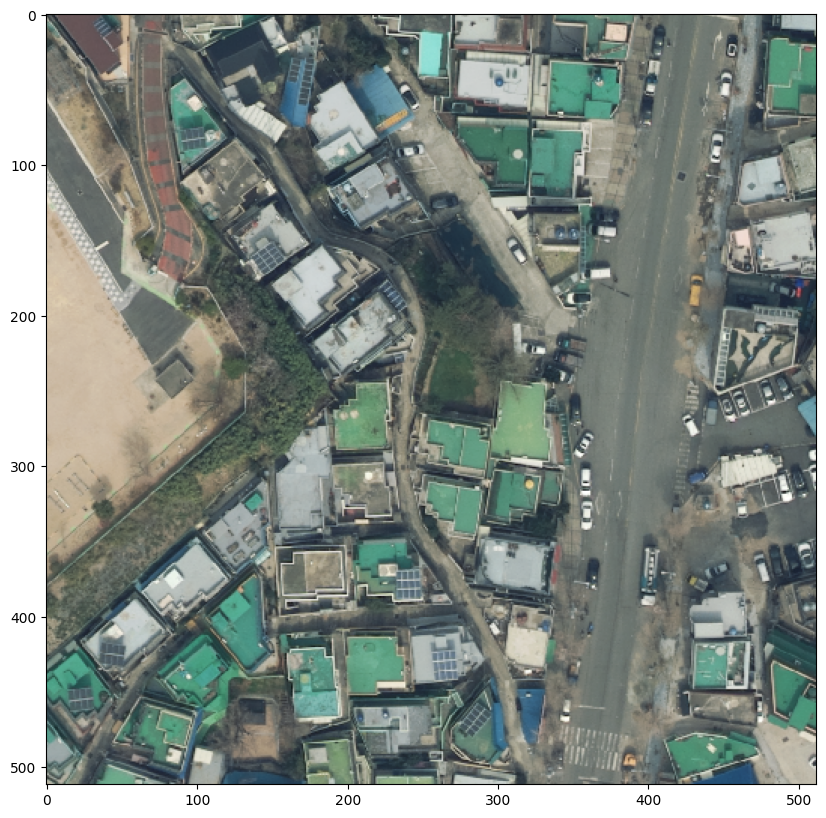

In [31]:
show_masks(image, masks, scores, box_coords=bound_box)

## Combining points and boxes

Points and boxes may be combined, just by including both types of prompts to the predictor. Here this can be used to select just the trucks's tire, instead of the entire wheel.

In [ ]:
input_box = np.array([425, 600, 700, 875])
input_point = np.array([[575, 750]])
input_label = np.array([0])

In [ ]:
masks, scores, logits = predictor.predict(
    point_coords=input_point,
    point_labels=input_label,
    box=input_box,
    multimask_output=False,
)

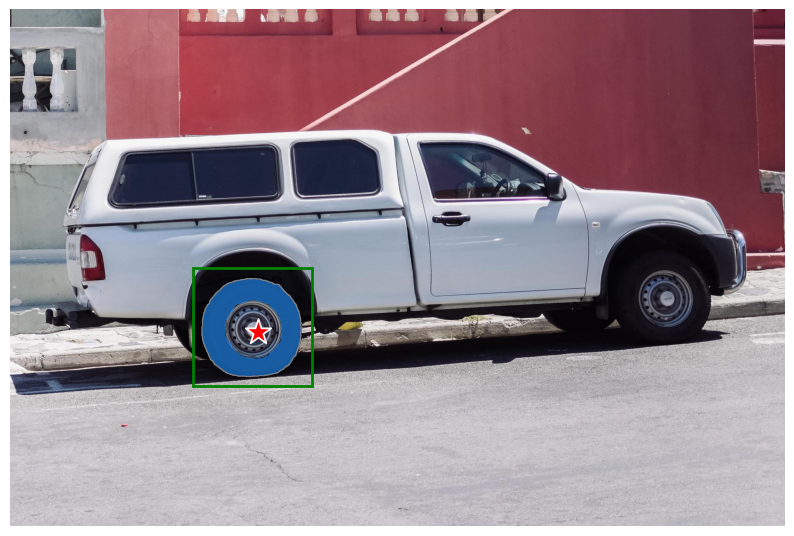

In [ ]:
show_masks(image, masks, scores, box_coords=input_box, point_coords=input_point, input_labels=input_label)

## Batched prompt inputs

`SAM2ImagePredictor` can take multiple input prompts for the same image, using `predict` method. For example, imagine we have several box outputs from an object detector.

In [ ]:
input_boxes = np.array([
    [75, 275, 1725, 850],
    [425, 600, 700, 875],
    [1375, 550, 1650, 800],
    [1240, 675, 1400, 750],
])

In [32]:
masks, scores, _ = predictor.predict(
    point_coords=None,
    point_labels=None,
    box=bound_box,
    multimask_output=False,
)

In [ ]:
masks.shape  # (batch_size) x (num_predicted_masks_per_input) x H x W

(4, 1, 1200, 1800)

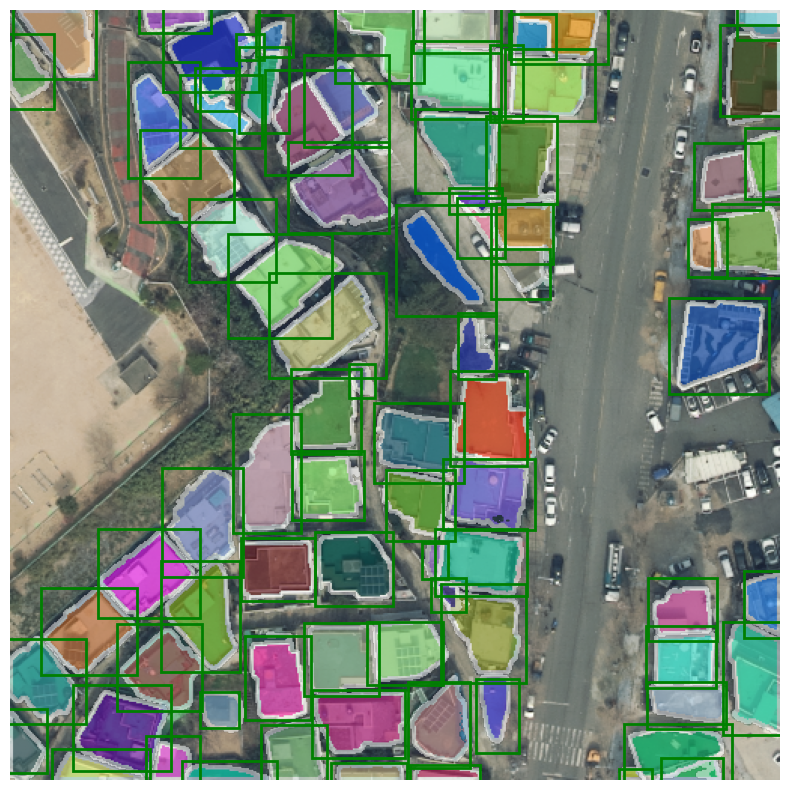

In [34]:
plt.figure(figsize=(10, 10))
plt.imshow(image)
for mask in masks:
    show_mask(mask.squeeze(0), plt.gca(), random_color=True)
for box in bound_box:
    show_box(box, plt.gca())
plt.axis('off')
plt.show()

## End-to-end batched inference
If all prompts are available in advance, it is possible to run SAM 2 directly in an end-to-end fashion. This also allows batching over images.

In [ ]:
image1 = image  # truck.jpg from above
image1_boxes = np.array([
    [75, 275, 1725, 850],
    [425, 600, 700, 875],
    [1375, 550, 1650, 800],
    [1240, 675, 1400, 750],
])

image2 = Image.open('images/groceries.jpg')
image2 = np.array(image2.convert("RGB"))
image2_boxes = np.array([
    [450, 170, 520, 350],
    [350, 190, 450, 350],
    [500, 170, 580, 350],
    [580, 170, 640, 350],
])

img_batch = [image1, image2]
boxes_batch = [image1_boxes, image2_boxes]

In [ ]:
predictor.set_image_batch(img_batch)

In [ ]:
masks_batch, scores_batch, _ = predictor.predict_batch(
    None,
    None,
    box_batch=boxes_batch,
    multimask_output=False
)

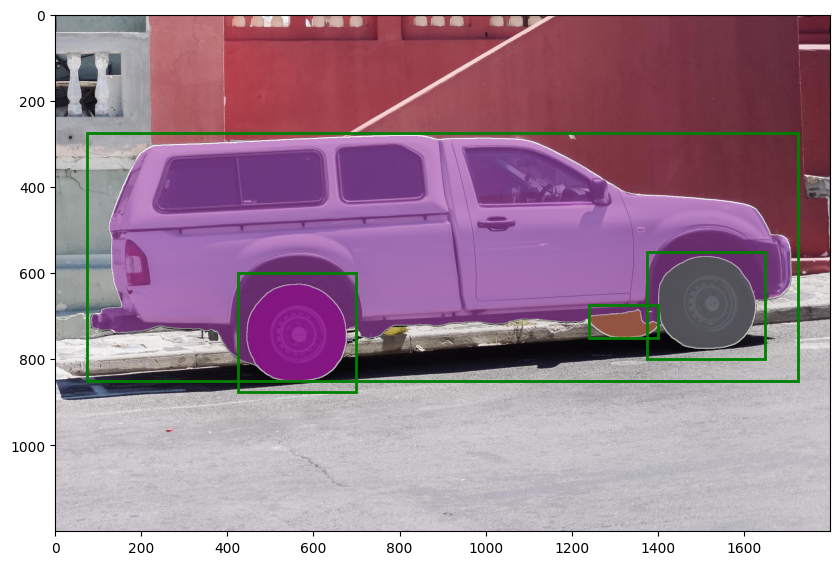

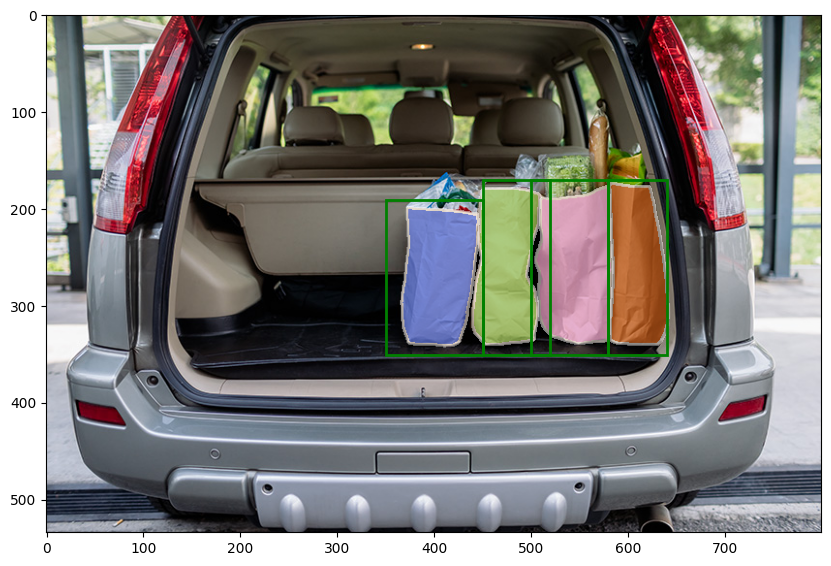

In [ ]:
for image, boxes, masks in zip(img_batch, boxes_batch, masks_batch):
    plt.figure(figsize=(10, 10))
    plt.imshow(image)
    for mask in masks:
        show_mask(mask.squeeze(0), plt.gca(), random_color=True)
    for box in boxes:
        show_box(box, plt.gca())

Similarly, we can have a batch of point prompts defined over a batch of images

In [ ]:
image1 = image  # truck.jpg from above
image1_pts = np.array([
    [[500, 375]],
    [[650, 750]]
    ]) # Bx1x2 where B corresponds to number of objects
image1_labels = np.array([[1], [1]])

image2_pts = np.array([
    [[400, 300]],
    [[630, 300]],
])
image2_labels = np.array([[1], [1]])

pts_batch = [image1_pts, image2_pts]
labels_batch = [image1_labels, image2_labels]

In [ ]:
masks_batch, scores_batch, _ = predictor.predict_batch(pts_batch, labels_batch, box_batch=None, multimask_output=True)

# Select the best single mask per object
best_masks = []
for masks, scores in zip(masks_batch,scores_batch):
    best_masks.append(masks[range(len(masks)), np.argmax(scores, axis=-1)])

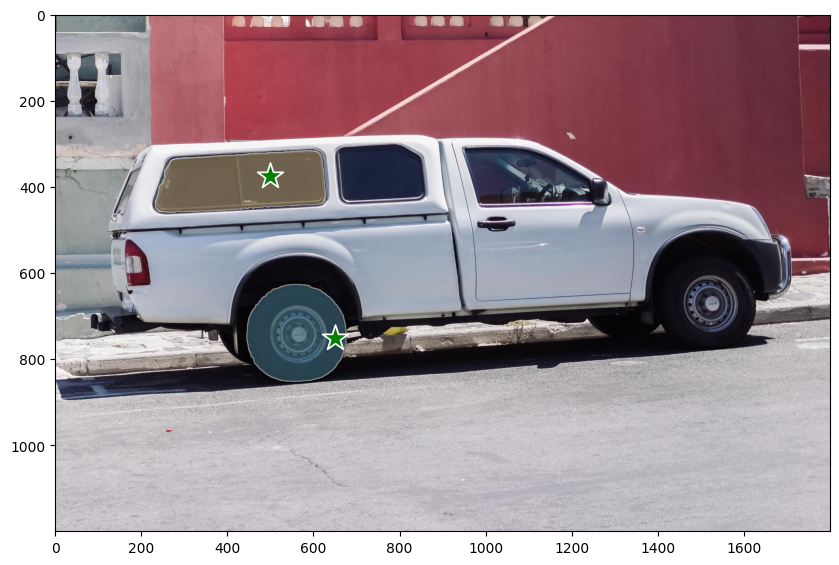

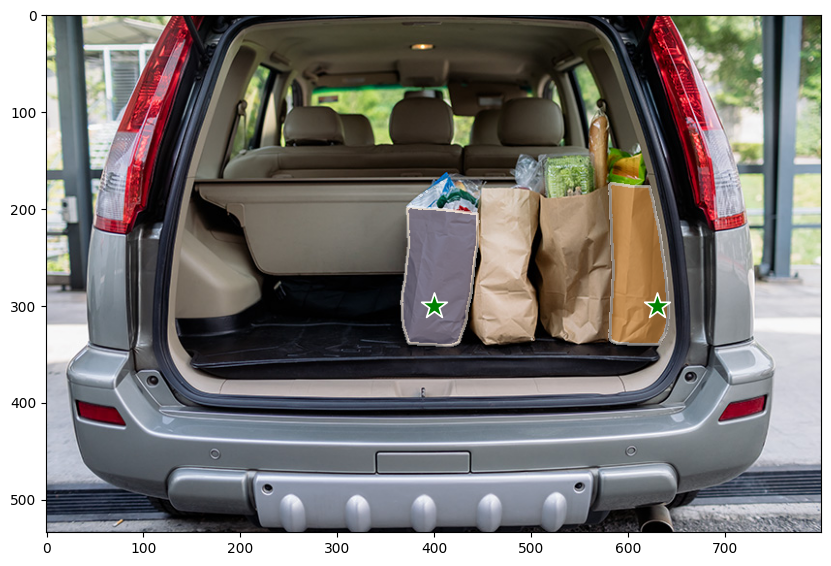

In [ ]:
for image, points, labels, masks in zip(img_batch, pts_batch, labels_batch, best_masks):
    plt.figure(figsize=(10, 10))
    plt.imshow(image)
    for mask in masks:
        show_mask(mask, plt.gca(), random_color=True)
    show_points(points, labels, plt.gca())